# Introduction: Austin 311 Analysis

As the city of Austin grows in population, so must the city's ability to provide 311 service to its citizens. From code compliance to animal control, the city of Austin must strive to meet the needs of an increasingly tech savvy populace by providing several easy methods to contact and receive services. 

With this project, I plan to take a sample of the 311 data available from the city of Austin, discover the most preferred access method, discover which areas of the city utilize 311 the most and how each area requests service.

## Methods:
This project will involve gathering data, filtering out noise, comparisons between observations and visualization.
I will be using the following Python packages for this project:
<li>Pandas: provides useful data frames in order to provide structure to acquired data
<li>Numpy: provides arrays
<li>MatplotLib: provides powerful data visualization features
<li>Folium: provides the ability to generate maps and overlay data


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium

%matplotlib inline

## Data:
Data will be obtained from <a href="https://data.austintexas.gov/Utilities-and-City-Services/Austin-311-Public-Data/xwdj-i9he">Data.AustinTexas.gov</a> <br>
We will be utilizing data from the following fields:
     <li>Service Request (SR) Number
    <li>SR Description
    <li>Method Received
    <li>SR Status
    <li>Created Date
    <li>Close Date
    <li>Latitude Coordinate
    <li>Longitude Coordinate
    <li>Council District
<br>

I will be taking all service requests that were created between 4/1/2020 and 4/30/2020 for further analysis.

In [2]:
df = pd.read_csv('Austin_311_Public_Data.csv',dtype = {
'Service Request (SR) Number':     str,
'SR Description':                  str,
'Method Received':                 str,
'SR Status':                       str,
'Status Change Date':              str,
'Created Date':                    str,
'Last Update Date':                str,
'Close Date':                      str,
'SR Location':                     str,
'Street Number':                   str,
'Street Name':                     str,
'City':                            str,
'Zip Code':                       np.float64,
'County':                          str,
'State Plane X Coordinate':       np.float64,
'State Plane Y Coordinate':       np.float64,
'Latitude Coordinate':            np.float64,
'Longitude Coordinate':           np.float64,
'(Latitude.Longitude)':            str,
'Council District':               np.float64,
'Map Page':                        str,
'Map Tile':                        str})

df

,Service Request (SR) Number,SR Description,Method Received,SR Status,Status Change Date,Created Date,Last Update Date,Close Date,SR Location,Street Number,...,Zip Code,County,State Plane X Coordinate,State Plane Y Coordinate,Latitude Coordinate,Longitude Coordinate,(Latitude.Longitude),Council District,Map Page,Map Tile
0,20-00094853,Austin Code - Request Code Officer,Phone,Closed,03/14/2020 09:17:50 AM,03/14/2020 09:05:49 AM,03/24/2020 09:17:21 AM,03/14/2020 09:17:50 AM,"739 W WILLIAM CANNON DR 2065, AUSTIN, TX 78745",739,...,78745.0,TRAVIS,3.100039e+06,1.004472e+07,30.197409,-97.789895,"(30.19740938, -97.78989458)",2.0,644W,MG16
1,19-00422824,Injured / Sick Animal,Phone,Closed,11/03/2019 02:10:35 PM,11/03/2019 01:54:07 PM,11/03/2019 02:10:35 PM,11/03/2019 02:10:35 PM,"NORTHLAND DR & N MOPAC EXPY SVRD SB, AUSTIN, TX",NaN,...,78731.0,TRAVIS,3.109582e+06,1.009564e+07,30.336784,-97.755961,"(30.33678393, -97.75596129)",10.0,524Z,MH28
2,19-00422828,Animal Control - Assistance Request,Phone,Closed,11/03/2019 02:40:35 PM,11/03/2019 01:59:18 PM,11/03/2019 02:40:35 PM,11/03/2019 02:40:35 PM,"811 HUNTINGDON PL, AUSTIN, TX 78745",811,...,78745.0,TRAVIS,3.099276e+06,1.004432e+07,30.196355,-97.792338,"(30.19635498, -97.79233776)",2.0,643Z,MF16
3,18-00407565,Animal Control - Assistance Request,Phone,Closed,12/21/2019 10:56:38 AM,11/29/2018 12:48:09 PM,12/21/2019 10:56:38 AM,12/21/2019 10:56:38 AM,"1520 RUTHERFORD LN, AUSTIN, TX 78754",1520,...,78754.0,TRAVIS,3.133220e+06,1.009659e+07,30.337863,-97.680980,"(30.33786336, -97.68097996)",1.0,526Y,MM28
4,19-00308199,Obstruction in ROW,Phone,Resolved,12/17/2019 11:02:41 AM,08/13/2019 10:24:30 AM,12/17/2019 11:02:40 AM,12/17/2019 11:02:41 AM,"1722 W ANDERSON LN, AUSTIN, TX 78757",1722,...,78757.0,TRAVIS,3.119470e+06,1.010183e+07,30.353154,-97.724167,"(30.35315368, -97.72416694)",7.0,525L,MK29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
909132,19-00373555,Loud Commercial Music,Spot311 Interface,Closed,09/29/2019 06:06:48 PM,09/28/2019 10:30:13 PM,09/29/2019 06:06:47 PM,09/29/2019 06:06:48 PM,"710 W 6TH ST, AUSTIN, TX 78701",710,...,78701.0,TRAVIS,3.112006e+06,1.007150e+07,30.270255,-97.750056,"(30.27025461, -97.75005629)",9.0,585S,MJ22
909133,19-00373540,Street Light Issue- Address,Phone,Closed,09/30/2019 12:20:43 PM,09/28/2019 10:19:17 PM,09/30/2019 12:20:42 PM,09/30/2019 12:20:43 PM,"3109 BESSIE AVE, AUSTIN, TX 78617",3109,...,78617.0,TRAVIS,3.148309e+06,1.004803e+07,30.203380,-97.636893,"(30.20338018, -97.63689345)",2.0,647Q,MP17
909134,19-00373548,Traffic Signal - Maintenance,Phone,Closed,10/01/2019 09:39:03 AM,09/28/2019 10:27:07 PM,10/01/2019 09:39:03 AM,10/01/2019 09:39:03 AM,"W BRAKER LN & N MOPAC EXPY SVRD SB, AUSTIN, TX",NaN,...,78759.0,TRAVIS,3.116194e+06,1.011737e+07,30.396101,-97.733400,"(30.39610077, -97.73340002)",7.0,495F,MJ33
909135,19-00373518,Debris in Street,Phone,Closed,03/28/2020 01:02:29 AM,09/28/2019 09:46:47 PM,03/28/2020 01:02:29 AM,03/28/2020 01:02:29 AM,"200 W 6TH ST, AUSTIN, TX 78701",200,...,78701.0,TRAVIS,3.113820e+06,1.007098e+07,30.268730,-97.744352,"(30.26873045, -97.74435239)",9.0,585S,MJ22


Below we see the metadata for each column in our data set. 

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 909137 entries, 0 to 909136
Data columns (total 22 columns):
Service Request (SR) Number    909137 non-null object
SR Description                 909137 non-null object
Method Received                909137 non-null object
SR Status                      909137 non-null object
Status Change Date             909137 non-null object
Created Date                   909137 non-null object
Last Update Date               909137 non-null object
Close Date                     904944 non-null object
SR Location                    902889 non-null object
Street Number                  726514 non-null object
Street Name                    902857 non-null object
City                           899400 non-null object
Zip Code                       899262 non-null float64
County                         894108 non-null object
State Plane X Coordinate       902889 non-null float64
State Plane Y Coordinate       902889 non-null float64
Latitude Coordinate   

The shape refers to the number of rows (x) and the number of columns (y) in a data set.

In [4]:
df.shape

(909137, 22)

Let's rename the columns to make them easier to work with

In [5]:
df = df.loc[:,[
    'Service Request (SR) Number',
    'SR Description',
    'Method Received',
    'SR Status',
    'Created Date',
    'Close Date',
    'Zip Code',
    'Latitude Coordinate',
    'Longitude Coordinate',
    'Council District'
    ]]
df.rename(columns = {'Service Request (SR) Number':'ServiceRequestNumber',
                     'SR Description':'Description',
                     'Method Received':'MethodReceived',
                     'SR Status':'Status',
                     'Created Date':'Created',
                     'Close Date':'Closed',
                     'Zip Code':'ZipCode',
                     'Latitude Coordinate':'Lat',
                     'Longitude Coordinate':'Long',
                     'Council District':'District'
                      },inplace = True)
df

,ServiceRequestNumber,Description,MethodReceived,Status,Created,Closed,ZipCode,Lat,Long,District
0,20-00094853,Austin Code - Request Code Officer,Phone,Closed,03/14/2020 09:05:49 AM,03/14/2020 09:17:50 AM,78745.0,30.197409,-97.789895,2.0
1,19-00422824,Injured / Sick Animal,Phone,Closed,11/03/2019 01:54:07 PM,11/03/2019 02:10:35 PM,78731.0,30.336784,-97.755961,10.0
2,19-00422828,Animal Control - Assistance Request,Phone,Closed,11/03/2019 01:59:18 PM,11/03/2019 02:40:35 PM,78745.0,30.196355,-97.792338,2.0
3,18-00407565,Animal Control - Assistance Request,Phone,Closed,11/29/2018 12:48:09 PM,12/21/2019 10:56:38 AM,78754.0,30.337863,-97.680980,1.0
4,19-00308199,Obstruction in ROW,Phone,Resolved,08/13/2019 10:24:30 AM,12/17/2019 11:02:41 AM,78757.0,30.353154,-97.724167,7.0
...,...,...,...,...,...,...,...,...,...,...
909132,19-00373555,Loud Commercial Music,Spot311 Interface,Closed,09/28/2019 10:30:13 PM,09/29/2019 06:06:48 PM,78701.0,30.270255,-97.750056,9.0
909133,19-00373540,Street Light Issue- Address,Phone,Closed,09/28/2019 10:19:17 PM,09/30/2019 12:20:43 PM,78617.0,30.203380,-97.636893,2.0
909134,19-00373548,Traffic Signal - Maintenance,Phone,Closed,09/28/2019 10:27:07 PM,10/01/2019 09:39:03 AM,78759.0,30.396101,-97.733400,7.0
909135,19-00373518,Debris in Street,Phone,Closed,09/28/2019 09:46:47 PM,03/28/2020 01:02:29 AM,78701.0,30.268730,-97.744352,9.0


Because this report will be heavily dependent on location, I am removing all records without Latitude/Longitude coordinates or a District value.

In [6]:
df.dropna(subset = ['Lat','Long','District'], inplace = True)

Here I am changing the Created Date and Closed date columns to Datetime format and sorting by Created date

In [7]:
df['Created'] = pd.to_datetime(df['Created'])
df['Closed'] = pd.to_datetime(df['Closed'])

df.sort_values('Created', ascending = False)

,ServiceRequestNumber,Description,MethodReceived,Status,Created,Closed,ZipCode,Lat,Long,District
67426,20-00183289,Injured / Sick Animal,Phone,Open,2020-05-09 18:59:55,NaT,78702.0,30.270681,-97.714203,1.0
67424,20-00183288,Parking Violation Enforcement,Spot311 Interface,New,2020-05-09 18:57:09,NaT,78741.0,30.244512,-97.723473,3.0
67429,20-00183287,Parking Violation Enforcement,Spot311 Interface,New,2020-05-09 18:57:06,NaT,78741.0,30.242510,-97.718205,3.0
67428,20-00183285,Loose Animal Not Dog,Phone,Open,2020-05-09 18:53:20,NaT,78723.0,30.285913,-97.698429,1.0
67427,20-00183283,Traffic Signal - Maintenance,Phone,Open,2020-05-09 18:49:34,NaT,78741.0,30.232382,-97.720413,3.0
...,...,...,...,...,...,...,...,...,...,...
407511,14-00000452,Animal Control - Assistance Request,Phone,Closed,2014-01-01 16:41:55,2018-01-09 11:31:01,78724.0,30.305714,-97.644432,1.0
236792,14-00000436,Injured / Sick Animal,Phone,Closed,2014-01-01 15:53:09,2016-07-05 10:49:12,78745.0,30.208442,-97.781611,2.0
398545,14-00000395,Found Animal - Pick Up,Phone,Closed,2014-01-01 13:40:06,2018-01-09 11:31:01,78729.0,30.457700,-97.774907,6.0
589061,14-00000378,Loose Dog,Phone,Closed,2014-01-01 13:02:46,2014-12-23 19:14:35,78724.0,30.302907,-97.653892,1.0


Finally, I am filtering out all records outside of our previously mentioned date range (4/1/20 - 4/30/20)

In [8]:
filt = (df['Created'] >= '2020-04-01') & (df['Created'] <= '2020-04-30')
df = df[filt].sort_values('Created', ascending = False)
df

,ServiceRequestNumber,Description,MethodReceived,Status,Created,Closed,ZipCode,Lat,Long,District
35840,20-00169063,Austin Code - Request Code Officer,Phone,Closed,2020-04-29 23:07:21,2020-04-29 23:19:12,78701.0,30.259146,-97.737670,9.0
35839,20-00169061,Austin Code - Request Code Officer,Mobile Device,Closed,2020-04-29 23:05:22,2020-04-29 23:13:11,78701.0,30.260485,-97.739317,9.0
77480,20-00169059,Austin Code - Short Term Rental Complaint SR,Spot311 Interface,Closed,2020-04-29 23:01:14,2020-04-29 23:10:12,78701.0,30.270563,-97.749009,9.0
28010,20-00169058,Street Light Issue- Address,Mobile Device,Closed,2020-04-29 23:00:39,2020-05-01 08:41:42,78701.0,30.259417,-97.737589,9.0
35820,20-00169057,Austin Code - Request Code Officer,Mobile Device,Closed,2020-04-29 23:00:34,2020-04-29 23:10:13,78702.0,30.258241,-97.728571,3.0
...,...,...,...,...,...,...,...,...,...,...
91855,20-00125529,ARR Missed Recycling,Phone,Closed,2020-04-01 07:18:22,2020-04-06 08:22:08,78745.0,30.221186,-97.785504,5.0
91836,20-00125513,ARR Dead Animal Collection,Spot311 Interface,Closed,2020-04-01 06:34:03,2020-04-01 10:56:02,78748.0,30.174331,-97.790535,2.0
76614,20-00125505,Parking Violation Enforcement,Spot311 Interface,Closed,2020-04-01 05:43:01,2020-04-01 07:26:06,78744.0,30.210885,-97.724681,2.0
90551,20-00125471,Austin Code - Construction Rest Break Complaint,Spot311 Interface,Closed,2020-04-01 00:54:44,2020-04-01 01:04:08,78702.0,30.271414,-97.730936,1.0


## Analysis:


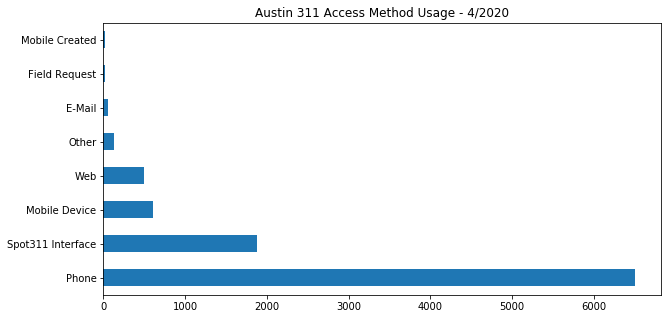

Phone                6501
Spot311 Interface    1877
Mobile Device         602
Web                   500
Other                 126
E-Mail                 60
Field Request          16
Mobile Created         13
Name: MethodReceived, dtype: int64


In [9]:
dfMR = df['MethodReceived'].value_counts()

dfMR.plot(kind='barh', figsize = (10,5), title = 'Austin 311 Access Method Usage - 4/2020')
plt.show()

print(dfMR)

As we can see above, it's clear that citizens dial into 311 far more than the other methods.

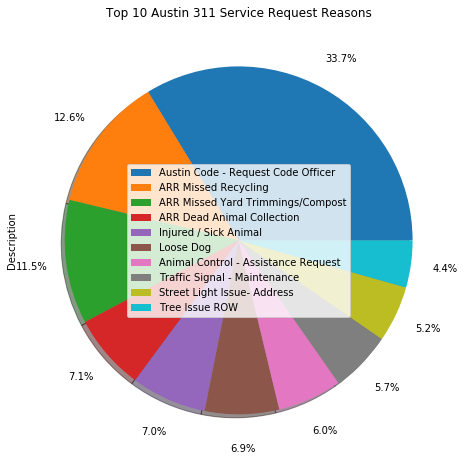

Austin Code - Request Code Officer     2044
ARR Missed Recycling                    761
ARR Missed Yard Trimmings/Compost       698
ARR Dead Animal Collection              430
Injured / Sick Animal                   424
Loose Dog                               418
Animal Control - Assistance Request     362
Traffic Signal - Maintenance            344
Street Light Issue- Address             317
Tree Issue ROW                          265
Name: Description, dtype: int64

In [10]:
dfD = df['Description'].value_counts()


dfD.head(10).plot(kind='pie', 
                  autopct='%1.1f%%', 
                  pctdistance = 1.2, 
                  labeldistance = None, 
                  figsize = (30,8), 
                  shadow = True,
                 title = 'Top 10 Austin 311 Service Request Reasons')
plt.legend(loc='center')

plt.show()
dfD.head(10)

Above, we have a breakdown of the top 10 most numerous service requests

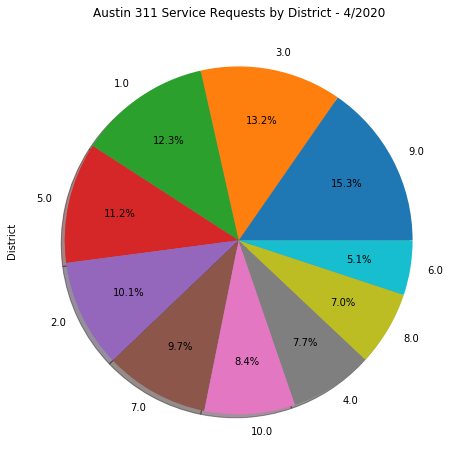

9.0     1488
3.0     1276
1.0     1197
5.0     1088
2.0      975
7.0      940
10.0     817
4.0      748
8.0      674
6.0      492
Name: District, dtype: int64


In [19]:
dfDist = df['District'].value_counts()

dfDist.plot(kind='pie', 
                  autopct='%1.1f%%', 
                  pctdistance = 0.7,  
                  figsize = (30,8), 
                  shadow = True,
                  title = 'Austin 311 Service Requests by District - 4/2020')
plt.show()

print(dfDist)


As we can see above, district 9 (which equates to the downtown area of Austin) contains the most service requests.

## Mapping:
I'm curious to see exactly where these requests are made. Luckily, we have access to the latitude and longitude coordinates of each record, along with the specific city district. Please feel free to examine the map below, clicking on a marker will display information about the Service request, district and method used.

In [21]:
clusters = 10

austin_map = folium.Map([30.2672, -97.7431], zoom_start = 11)

x = np.arange(clusters)
ys = [i + x + (i*x)**2 for i in range(clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for sr, lat, lon, mthd, dist,desc in zip(df['ServiceRequestNumber'],
                                         df['Lat'], 
                                         df['Long'], 
                                         df['MethodReceived'], 
                                         df['District'], 
                                         df['Description']):
    label = folium.Popup('SR#: ' + str(sr) +' '+ str(desc)+', ' +' District: ' + str(dist) + ', ' + 'Method used: ' + str(mthd), parse_html=True, max_width = 450)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(dist)-1],
        fill=True,
        fill_color=rainbow[int(dist)-1],
        fill_opacity=0.4).add_to(austin_map)
       
austin_map

## Results/Discussion:

<li>Dialing 311 is the most preferred method for creating a service request by far. The ease of picking up a phone and dialing 3 numbers is likely hard to beat. I noticed that access via mobile take up multiple access spots in the list: "Spot311 Interface", "Mobile Device" and "Mobile Created". Spot311 appears to be a mobile app created specifically for public issue reporting. I've deduced that "Mobile Device" could possibly be a user dialing 311 on their cell phone. Unfortunately, I haven't found any information concerning "Mobile Created".
<li>District 9 created the most service requests. The top 4 districts are all either downtown or downtown adjacent and I would expect that the hustle and bustle of the central districts would indeed produce more service requests.   
<li>Please feel free to experiment with the district map above for an indepth look at requests in each district

## Conclusion:
In this report, I was able to obtain a month of data from the city of Austin in order to examine how citizens utilize the 311 system. I was able to determine the most utilized method of access, the most requested service and I was able to pinpoint the locations of the heaviest 311 usage. I believe a report like this could be used as a first step in determining resource allocation and budgeting.